In [2]:
import numpy as np
import pandas as pd

def generate_snow_depth_trend(start_year=1975, end_year=2024, elevation_m=1700, seed=42):
    np.random.seed(seed)
    
    warming_rate = 0.03  # °C per year increase
    all_data = []

    for year in range(start_year, end_year + 1):
        dates = pd.date_range(start=f"{year}-01-01", end=f"{year}-12-31", freq='D')
        snow_depth = []
        current_depth = 0

        # Adjusted base temperature due to warming
        base_temp = -2 + warming_rate * (year - start_year)  # colder winters before

        # Snowfall probability also decreases slightly over time
        base_snow_chance = 0.25 - 0.001 * (year - start_year)  # ~0.25 → ~0.20

        for date in dates:
            month = date.month
            dayofyear = date.dayofyear

            # Winter/Snow Season logic
            in_snow_season = month in [11, 12, 1, 2, 3, 4]

            # Daily temperature with trend and noise
            temp = np.random.normal(loc=base_temp if in_snow_season else 2 + warming_rate * (year - start_year), scale=4)
            snowfall = 0
            melt = 0

            # Chance of snowfall if in season
            if in_snow_season:
                if np.random.rand() < base_snow_chance:
                    snowfall = np.random.gamma(shape=2, scale=5)  # Typical 0–50 cm storm

            # Melting and compaction
            if current_depth > 0:
                if temp > 0:
                    melt = temp * 0.5 + np.random.rand() * 2
                else:
                    melt = 0.1 + np.random.rand() * 0.2  # slow compaction

            current_depth = max(0, current_depth + snowfall - melt)
            snow_depth.append(round(current_depth, 1))

        yearly_df = pd.DataFrame({
            "date": dates,
            "year": year,
            "snow_depth_cm": snow_depth
        })
        all_data.append(yearly_df)

    return pd.concat(all_data, ignore_index=True)

In [3]:
df = generate_snow_depth_trend().drop(columns='year')

In [4]:
df['date'] = pd.to_datetime(df['date'])
df = df.set_index('date')
df_monthly = df.resample('ME').mean()

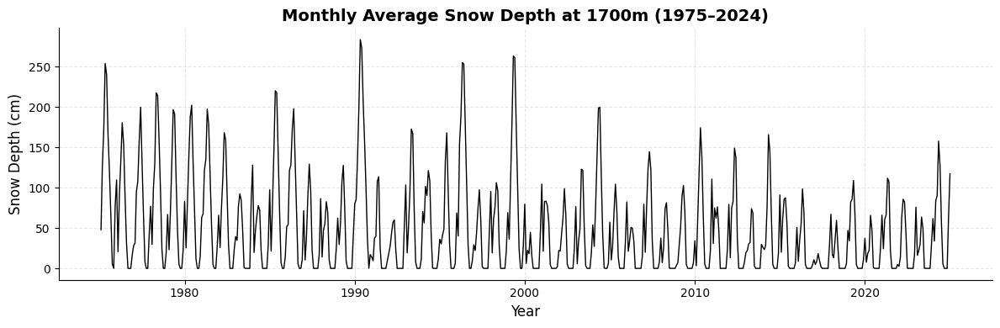

In [5]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.plot(df_monthly.index, df_monthly.values, color='black', linewidth=1)

# Minimalist styling
plt.title('Monthly Average Snow Depth at 1700m (1975–2024)', fontsize=14, weight='bold')
plt.ylabel('Snow Depth (cm)', fontsize=12)
plt.xlabel('Year', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()

# Remove top and right spines
for spine in ['top', 'right']:
    plt.gca().spines[spine].set_visible(False)

# Simplify x-axis ticks
plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)

plt.show()

In [6]:
import numpy as np
import pandas as pd
from itertools import product
from tqdm import tqdm

def generate_sim_like_snow_data(start_year=1970, end_year=2025, seed=42):
    np.random.seed(seed)

    # Define Lambert II extended grid in Isère
    x_vals = np.arange(8300, 9500 + 1, 80)  # 8 km step
    y_vals = np.arange(18500, 19800 + 1, 80)  # 8 km step
    grid_points = list(product(x_vals, y_vals))  # all (X, Y) combinations

    # Date range
    dates = pd.date_range(start=f"{start_year}-01-01", end=f"{end_year}-12-31", freq='D')
    n_days = len(dates)

    records = []

    print("Generating synthetic SIM data...")
    for (x, y) in tqdm(grid_points):
        # Simulate "altitude" from Y (as higher north = higher Alps = more snow)
        alt_proxy = (y - 18500) / 1300  # scaled 0–1

        # Base snow potential (in m)
        base_snow_potential = 2.5 * alt_proxy  # more snow in higher cells

        # Yearly warming factor (less snow over time)
        for i, date in enumerate(dates):
            year = date.year
            dayofyear = date.timetuple().tm_yday
            month = date.month

            # Base seasonal snow pattern (peak in Jan–Feb)
            seasonal_factor = max(0, np.sin((np.pi * (dayofyear - 50)) / 180))

            # Yearly warming trend (e.g., 0.5m lost over 55 years)
            warming_reduction = 0.5 * (year - start_year) / (end_year - start_year)

            # Add noise
            noise = np.random.normal(0, 0.1)

            snow_m = max(0, base_snow_potential * seasonal_factor - warming_reduction + noise)

            records.append((date, x, y, round(snow_m, 2)))

    df = pd.DataFrame(records, columns=["date", "X", "Y", "snow_m"])
    return df

In [6]:
df = generate_sim_like_snow_data()

Generating synthetic SIM data...


100%|██████████| 272/272 [01:03<00:00,  4.26it/s]


In [ ]:
df['date'] = pd.to_datetime(df['date'])
df['month'] = df['date'].dt.to_period('M')
monthly = df.groupby(['month', 'X', 'Y'])['snow_m'].mean().reset_index()
monthly['month'] = monthly['month'].astype(str)

In [14]:
from pyproj import Transformer

# Lambert II étendu (EPSG:27572) → WGS84 (EPSG:4326)
transformer = Transformer.from_crs("EPSG:27572", "EPSG:4326", always_xy=True)

monthly['lon'], monthly['lat'] = transformer.transform(monthly['X'] * 100, monthly['Y'] * 100)

In [15]:
import plotly.express as px

fig = px.scatter_mapbox(
    monthly, lat="lat", lon="lon",
    size="snow_m", color="snow_m",
    animation_frame="month",
    size_max=15,
    color_continuous_scale="Blues",
    range_color=[0, 2],
    mapbox_style="carto-positron",
    zoom=7, center={"lat": 45.3, "lon": 5.6},
    title="Monthly Mean Snow Depth (m) in Isère (Synthetic)"
)

fig.update_layout(height=700, margin={"r":0,"t":50,"l":0,"b":0})
fig.show()

C:\Users\Dimitry\AppData\Local\Temp\ipykernel_12112\3928514145.py:3: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



In [16]:
import json
import urllib.request

# Example: load French departments GeoJSON
url = "https://france-geojson.gregoiredavid.fr/repo/departements.geojson"
with urllib.request.urlopen(url) as response:
    isere_geojson = json.load(response)

# Filter to Isère (code 38)
isere_feature = [f for f in isere_geojson['features'] if f['properties']['code'] == '38']
isere_geojson = {'type': 'FeatureCollection', 'features': isere_feature}

# Add to plot
fig.update_layout(mapbox_layers=[
    {
        'source': isere_geojson,
        'type': "line",
        'color': "black",
        'line': {'width': 1.5},
    }
])
fig.show()

In [7]:
df = pd.read_csv('./data/QUOT_SIM2_latest-20250701-20250806.csv.gz', sep=';', compression='gzip')

In [8]:
df['DATE'] = pd.to_datetime(df['DATE'], format='%Y%m%d')

In [9]:
df['coords'] = df['LAMBX'].astype(str)+' '+df['LAMBY'].astype(str)

In [29]:
coords_df = pd.DataFrame(df['coords'].value_counts()).reset_index()

In [30]:
coords_df

,coords,count
0,600 24010,37
1,760 23610,37
2,760 23930,37
3,760 24010,37
4,760 24090,37
...,...,...
9887,11960 17050,37
9888,11960 17130,37
9889,11960 17210,37
9890,11960 17290,37


In [12]:
from datetime import datetime

def generate_snow_data_from_coords(coords_df, start_year=1970, end_year=2025, seed=42):
    np.random.seed(seed)

    # Create daily date range
    dates = pd.date_range(start=f"{start_year}-01-01", end=f"{end_year}-12-31", freq='D')
    all_records = []

    # Normalize count column to [0.5, 1.5] as an elevation proxy
    counts = coords_df['count']
    elevation_factor = 0.5 + (counts - counts.min()) / (counts.max() - counts.min())  # scaled [0.5, 1.5]

    print("Generating synthetic snow depth data...")

    for idx, row in coords_df.iterrows():
        x, y, elev_scale = row['X'], row['Y'], elevation_factor.iloc[idx]

        # Simulate daily snow depth
        current_depth = 0
        for date in dates:
            year = date.year
            dayofyear = date.timetuple().tm_yday
            month = date.month

            # Seasonal effect (more snow in Jan–Feb, less in shoulder months)
            seasonal_factor = max(0, np.sin((np.pi * (dayofyear - 50)) / 180))

            # Warming trend reduces snow linearly over years
            warming_penalty = 0.4 * (year - start_year) / (end_year - start_year)

            # Snow potential = elevation effect × seasonal pattern - warming
            snow_potential = elev_scale * 2.0 * seasonal_factor - warming_penalty

            # Add some daily variability
            noise = np.random.normal(0, 0.1)

            # Final snow depth, clipped at 0
            snow_m = max(0, snow_potential + noise)

            all_records.append((date, x, y, round(snow_m, 2)))

    # Build DataFrame
    df_snow = pd.DataFrame(all_records, columns=["date", "X", "Y", "snow_m"])
    return df_snow

In [43]:
import geopandas as gpd
from shapely.geometry import Point

# Load French departments GeoJSON and extract Isère (code 38)
departments_url = "https://france-geojson.gregoiredavid.fr/repo/departements.geojson"
departments = gpd.read_file(departments_url)
isere = departments[departments["code"] == "38"].to_crs("EPSG:27572")  # Match Lambert II étendu

# Create GeoDataFrame from coords
geometry = [Point(x, y) for x, y in zip(coords_df['X']*100, coords_df['Y']*100)]
gdf_coords = gpd.GeoDataFrame(coords_df, geometry=geometry, crs="EPSG:27572")

# Filter to keep only points within Isère
gdf_coords_isere = gdf_coords[gdf_coords.within(isere.unary_union)]
gdf_coords_isere = gdf_coords_isere.drop(columns="geometry")

gdf_coords_isere.head()

C:\Users\Dimitry\AppData\Local\Temp\ipykernel_6364\2276140119.py:14: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  gdf_coords_isere = gdf_coords[gdf_coords.within(isere.unary_union)]


,X,Y,count
6863,7960,20410,196
6864,7960,20490,196
6865,7960,20570,196
6866,7960,20650,196
6956,8040,20410,196


In [46]:
# coords_df[['X', 'Y']] = coords_df['coords'].str.split(expand=True).astype(int)
# coords_df = coords_df[['X', 'Y', 'count']]  # Keep relevant columns
coords_df = gdf_coords_isere.copy()
coords_df['X_m'] = coords_df['X']*100
coords_df['Y_m'] = coords_df['Y']*100

In [47]:
coords_df

,X,Y,count,X_m,Y_m
6863,7960,20410,196,796000,2041000
6864,7960,20490,196,796000,2049000
6865,7960,20570,196,796000,2057000
6866,7960,20650,196,796000,2065000
6956,8040,20410,196,804000,2041000
...,...,...,...,...,...
8056,9000,20490,330,900000,2049000
8140,9080,19930,330,908000,1993000
8141,9080,20010,330,908000,2001000
8229,9160,19930,330,916000,1993000


In [48]:
from pyproj import Transformer
from sklearn.neighbors import NearestNeighbors
import numpy as np

# Step 1: Convert Lambert II étendu (EPSG:27572) X/Y to WGS84 lat/lon
transformer = Transformer.from_crs("EPSG:27572", "EPSG:4326", always_xy=True)

In [ ]:
coords_df['lon'], coords_df['lat'] = transformer.transform(coords_df['X_m'].values, coords_df['Y_m'].values)

In [ ]:
coords_df['lon'], coords_df['lat'] = transformer.transform(coords_df['X_m'].values, coords_df['Y_m'].values)

In [50]:
df_alt = pd.read_csv('./data/Q_01_latest-2024-2025_autres-parametres.csv.gz', sep=';', compression='gzip')
df_alt = df_alt[['LAT', 'LON', 'ALTI']]

In [51]:
altitudes = df_alt[['LAT', 'LON', 'ALTI']].drop_duplicates()
nbrs = NearestNeighbors(n_neighbors=1).fit(altitudes[['LAT', 'LON']].values)
distances, indices = nbrs.kneighbors(coords_df[['lat', 'lon']].values)

In [52]:
coords_df['altitude_m'] = altitudes.iloc[indices.flatten()]['ALTI'].values
coords_df[['X', 'Y', 'X_m', 'Y_m', 'lat', 'lon', 'altitude_m']].head()

,X,Y,X_m,Y_m,lat,lon,altitude_m
6863,7960,20410,796000,2041000,45.341433,4.837191,196
6864,7960,20490,796000,2049000,45.413365,4.840441,196
6865,7960,20570,796000,2057000,45.485298,4.843699,196
6866,7960,20650,796000,2065000,45.557232,4.846966,196
6956,8040,20410,804000,2041000,45.339098,4.939185,196


In [53]:
coords_df = coords_df[['X','Y','altitude_m']]

In [54]:
coords_df = coords_df.rename(columns={'altitude_m':'count'})

In [56]:
coords_df = coords_df.reset_index(drop=True)

In [57]:
# Generate the synthetic snow dataset using provided coordinates
df_snow_synthetic = generate_snow_data_from_coords(coords_df, 2020, 2025)
df_snow_synthetic.head()

Generating synthetic snow depth data...


,date,X,Y,snow_m
0,2020-01-01,7960,20410,0.05
1,2020-01-02,7960,20410,0.00
2,2020-01-03,7960,20410,0.06
3,2020-01-04,7960,20410,0.15
4,2020-01-05,7960,20410,0.00


In [59]:
df_snow_synthetic['month'] = df_snow_synthetic['date'].dt.to_period('M')
monthly = df_snow_synthetic.groupby(['month', 'X', 'Y'])['snow_m'].mean().reset_index()
monthly['month'] = monthly['month'].astype(str)

In [60]:
transformer = Transformer.from_crs("EPSG:27572", "EPSG:4326", always_xy=True)

monthly['lon'], monthly['lat'] = transformer.transform(monthly['X'] * 100, monthly['Y'] * 100)

In [67]:
import plotly.express as px

fig = px.scatter_mapbox(
    monthly, lat="lat", lon="lon",
    size="snow_m", color="snow_m",
    animation_frame="month",
    size_max=15,
    color_continuous_scale="Blues",
    range_color=[0, 2],
    mapbox_style="carto-positron",
    zoom=7, center={"lat": 45.3, "lon": 5.6},
    title="Monthly Mean Snow Depth (m) in Isère (Synthetic)"
)

fig.update_layout(height=700, margin={"r":0,"t":50,"l":0,"b":0})
fig.update_traces(marker=dict(symbol="square"))
fig.show()

C:\Users\Dimitry\AppData\Local\Temp\ipykernel_6364\4156182878.py:3: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



In [62]:
import json
import urllib.request

# Example: load French departments GeoJSON
url = "https://france-geojson.gregoiredavid.fr/repo/departements.geojson"
with urllib.request.urlopen(url) as response:
    isere_geojson = json.load(response)

# Filter to Isère (code 38)
isere_feature = [f for f in isere_geojson['features'] if f['properties']['code'] == '38']
isere_geojson = {'type': 'FeatureCollection', 'features': isere_feature}

# Add to plot
fig.update_layout(mapbox_layers=[
    {
        'source': isere_geojson,
        'type': "line",
        'color': "black",
        'line': {'width': 1.5},
    }
])
fig.show()

In [74]:
import plotly.express as px
import json
import urllib.request

# Create the map with scatter_map
fig = px.scatter_map(
    monthly,
    lat="lat",
    lon="lon",
    size="snow_m",
    color="snow_m",
    animation_frame="month",
    size_max=10,
    color_continuous_scale="Blues",  # More vibrant than 'Blues'
    range_color=[0, 2],
    title="Monthly Mean Snow Depth (m) in Isère (Synthetic)",
    zoom=7,
    center={"lat": 45.3, "lon": 5.6},
    map_style="carto-positron"  # Same style, works with MapLibre
    
)
fig.update_layout(height=700, margin={"r":0,"t":50,"l":0,"b":0})

# Set marker symbol to squares
# fig.update_traces(marker=dict(symbol="square"))

# Add Isère boundary using GeoJSON
url = "https://france-geojson.gregoiredavid.fr/repo/departements.geojson"
with urllib.request.urlopen(url) as response:
    isere_geojson = json.load(response)

isere_feature = [f for f in isere_geojson["features"] if f["properties"]["code"] == "38"]
isere_geojson = {"type": "FeatureCollection", "features": isere_feature}

# Add the boundary as a layer
fig.update_layout(
    map_layers=[
        {
            "source": isere_geojson,
            "type": "line",
            "color": "black",
            "line": {"width": 1.5}
        }
    ]
)

fig.show()